In [1]:
# view feature map 

# 1. build network and load weight
from pcdet.datasets.kitti.kitti_dataset import KittiDataset
from pcdet.config import cfg, cfg_from_yaml_file
from pcdet.utils import common_utils
import pcdet.datasets.kitti.kitti_object_eval_python.kitti_common as kitti
from pcdet.models import build_network, load_data_to_gpu
from pathlib import Path


## 1.1 cfg
cfg_file = "./cfgs/kitti_models/sphoxelnet_simple.yaml"
# cfg_file = "./cfgs/kitti_models/second.yaml"
cfg_from_yaml_file(cfg_file, cfg)
## 1.2 data set
logger = common_utils.create_logger()

root_path = "../data/kitti/"
dataset = KittiDataset(
        dataset_cfg=cfg.DATA_CONFIG, class_names=cfg.CLASS_NAMES, training=True,
        root_path=Path(root_path), logger=logger
)
## 1.3 model
    
ckpt_path = "../output/kitti_models/sphoxelnet_simple/Center/ckpt/checkpoint_epoch_80.pth"
# ckpt_path = "../output/kitti_models/second/Smallx4/ckpt/checkpoint_epoch_50.pth"
model = build_network(model_cfg=cfg.MODEL, num_class=len(cfg.CLASS_NAMES), dataset=dataset)
model.to("cuda").eval()
model.load_params_from_file(filename=ckpt_path, logger=logger)


2020-08-19 03:36:57,984   INFO  Database filter by min points Car: 14357 => 13532
2020-08-19 03:36:57,986   INFO  Database filter by min points Pedestrian: 2207 => 2168
2020-08-19 03:36:57,987   INFO  Database filter by min points Cyclist: 734 => 705
2020-08-19 03:36:58,006   INFO  Database filter by difficulty Car: 13532 => 10759
2020-08-19 03:36:58,010   INFO  Database filter by difficulty Pedestrian: 2168 => 2075
2020-08-19 03:36:58,012   INFO  Database filter by difficulty Cyclist: 705 => 581
2020-08-19 03:36:58,030   INFO  Loading KITTI dataset
2020-08-19 03:36:58,145   INFO  Total samples for KITTI dataset: 3712


voxelmap_shape =  (40, 512, 512)
feature_map_size = [array([128, 128]), array([128, 128]), array([128, 128])]


2020-08-19 03:36:59,708   INFO  ==> Loading parameters from checkpoint ../output/kitti_models/sphoxelnet_simple/Center/ckpt/checkpoint_epoch_80.pth to GPU
2020-08-19 03:36:59,750   INFO  ==> Checkpoint trained from version: pcdet+0.3.0+4bf0766+pyd3b5c9e
2020-08-19 03:36:59,893   INFO  ==> Done (loaded 163/163)


In [11]:
len(dataset)

3712

In [2]:
import torch
# inference
data_dict = dataset[40]
data_dict = dataset.collate_batch([data_dict])
load_data_to_gpu(data_dict)

with torch.no_grad():
    pred_dicts, ret_dict = model(data_dict)

NCDHW =  1 128 2 128 128
spaital_feature shape = torch.Size([1, 256, 128, 128])


In [3]:
pred_dicts

[{'pred_boxes': tensor([[ 1.2262e+01,  4.9499e+00, -6.9833e-01,  1.9215e+00,  8.8173e-01,
            1.5941e+00,  4.8468e+00],
          [ 1.1104e+01,  1.0753e+00, -8.3709e-01,  1.6029e+00,  6.7134e-01,
            1.5210e+00,  4.8342e+00],
          [ 1.0807e+01,  2.9315e+00, -5.3378e-01,  9.8830e-01,  4.3059e-01,
            1.8871e+00,  1.7405e+00],
          [ 1.3241e+01, -2.7068e+00, -8.8282e-01,  3.6084e+00,  1.6607e+00,
            1.5635e+00,  6.0855e+00],
          [ 6.6580e+00,  2.5963e-01, -7.0322e-01,  5.1783e-01,  6.0307e-01,
            1.7278e+00,  2.7013e+00],
          [ 1.4902e+01, -5.9725e+00, -7.1733e-01,  7.2606e-01,  5.9487e-01,
            1.5315e+00,  5.7548e+00],
          [ 6.8577e+00, -4.4827e+00, -8.9505e-01,  3.8294e+00,  1.6133e+00,
            1.4467e+00,  5.9676e+00],
          [ 9.7127e+00, -8.6425e+00, -8.2170e-01,  4.0023e+00,  1.7157e+00,
            1.6843e+00,  4.7409e+00],
          [ 6.5315e+00, -3.8321e-01, -6.1856e-01,  7.6061e-01,  6.4944e-01

In [4]:
ret_dict

{'gt': 33,
 'roi_0.3': 0,
 'rcnn_0.3': 33,
 'roi_0.5': 0,
 'rcnn_0.5': 32,
 'roi_0.7': 0,
 'rcnn_0.7': 27}

In [5]:
data_dict.keys()

dict_keys(['points', 'frame_id', 'gt_boxes', 'use_lead_xyz', 'voxels', 'voxel_coords', 'voxel_num_points', 'image_shape', 'batch_size', 'voxel_features', 'encoded_spconv_tensor', 'encoded_spconv_tensor_stride', 'multi_scale_3d_features', 'spatial_features', 'spatial_features_stride', 'spatial_features_2d', 'batch_cls_preds', 'batch_box_preds', 'cls_preds_normalized'])

In [6]:
# the bev feature map
data_dict['spatial_features'].shape

torch.Size([1, 256, 128, 128])

/home/user/anaconda3/envs/sphconv/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


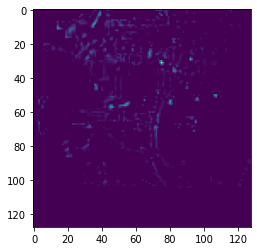

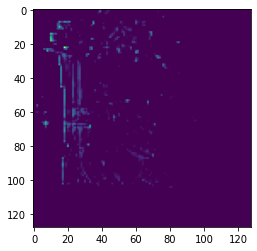

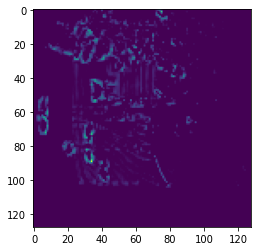

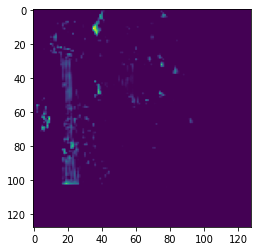

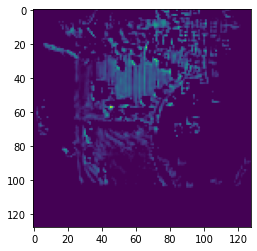

...

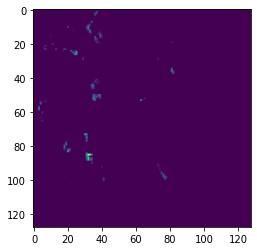

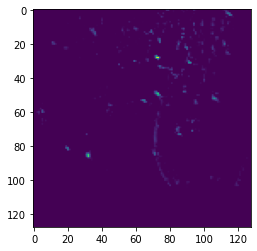

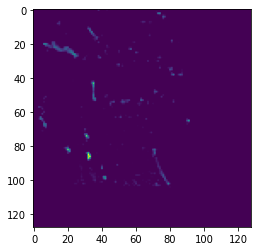

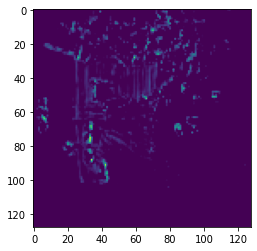

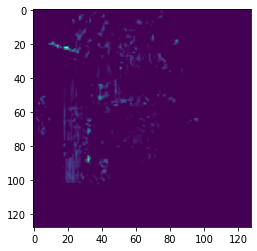

In [7]:

bev = data_dict['spatial_features']

# view bev
import matplotlib.pyplot as plt
for i in range(256):
    plt.figure()
    plt.imshow(bev[0,i].cpu().numpy())

In [8]:
# feature map after bev backbone
bev = data_dict['spatial_features_2d']
bev.shape



torch.Size([1, 512, 128, 128])

/home/user/anaconda3/envs/sphconv/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


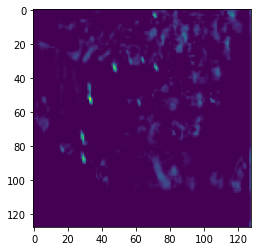

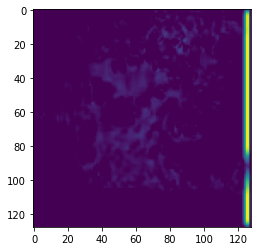

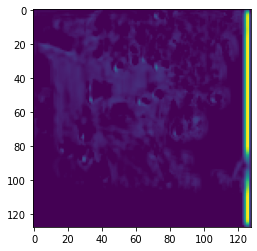

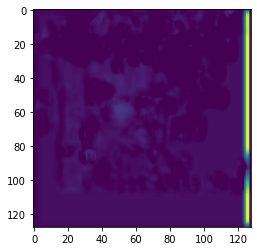

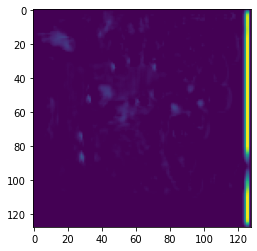

...

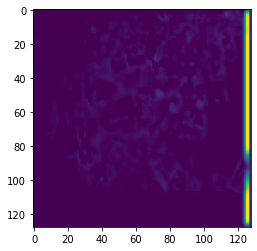

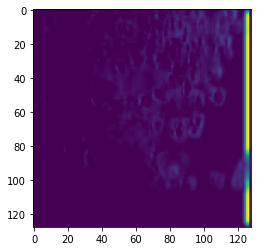

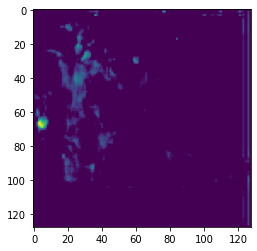

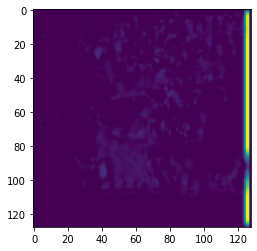

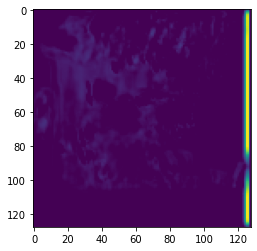

In [9]:
# view bev
import matplotlib.pyplot as plt
for i in range(256):
    plt.figure()
    plt.imshow(bev[0,i].cpu().numpy())
    